In [1]:
import numpy as np 
import pandas as pd

In [5]:
df=pd.read_csv('imageRcognition.csv')

In [6]:
df.sample(5)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
28663,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12375,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
17740,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19111,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33047,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
import matplotlib.pyplot as plt

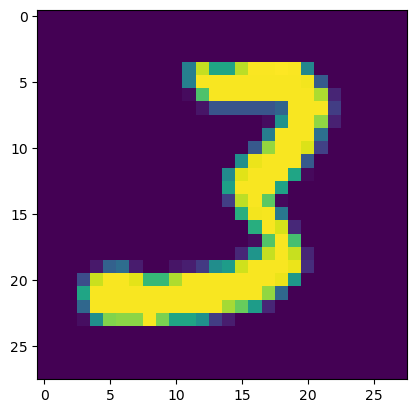

In [8]:
plt.imshow(df.iloc[33047,1:].values.reshape(28,28))

In [26]:
X=df.iloc[:,1:]
y=df.iloc[:,0]

In [27]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [28]:
from sklearn.neighbors import KNeighborsClassifier

In [29]:
knn=KNeighborsClassifier()

In [30]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [31]:
import time
start=time.time()
y_pred=knn.predict(X_test)
print(time.time()-start)

27.131195068359375


In [32]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [33]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [41]:
from sklearn.decomposition import PCA
pca=PCA(n_components=200)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [42]:
X_train_trf.shape

(33600, 200)

In [43]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [44]:
start=time.time()
y_pred1=knn.predict(X_test_trf)
print(time.time()-start)
accuracy_score(y_test,y_pred1)

6.029049873352051


0.9511904761904761

In [45]:
pca=PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

C:\Users\iitia\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


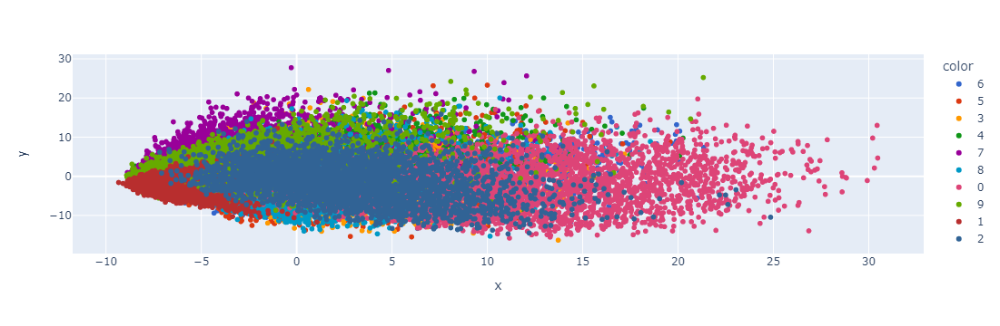

In [47]:
import plotly.express as px
y_train_trf=y_train.astype(str)
fig=px.scatter(x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               color=y_train_trf,
               color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [48]:
pca=PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

C:\Users\iitia\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



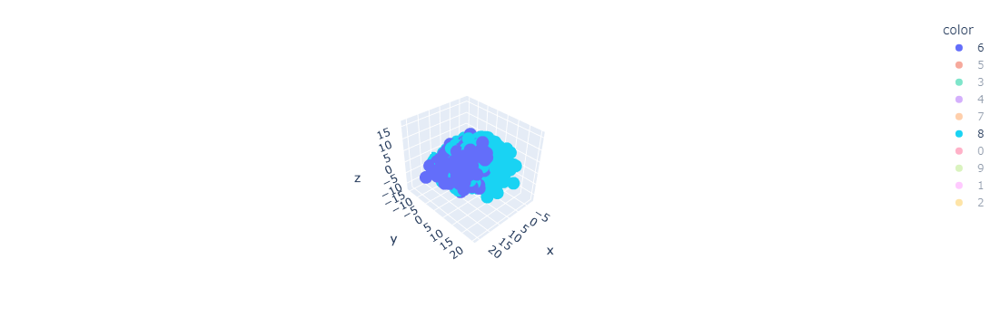

In [56]:
y_train_trf=y_train.astype(str)
fig=px.scatter_3d(df,x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               z=X_train_trf[:,2],
               color=y_train_trf )
fig.update_layout(margin=dict(l=20,r=20,t=20,b=20))
fig.show()

In [62]:
pca.explained_variance_
# eigen values

array([40.67111198, 29.17023393, 26.74459611])

In [63]:
pca.components_.shape
# eigen vectors

(3, 784)

In [65]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [67]:
pca=PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [70]:
pca.explained_variance_.shape

(784,)

In [72]:
pca.components_.shape

(784, 784)

In [74]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

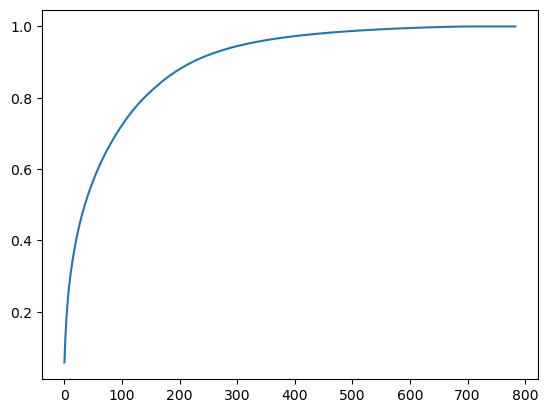

In [75]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))